## Project 12 - Simulating Randomness

In class notes for project 12

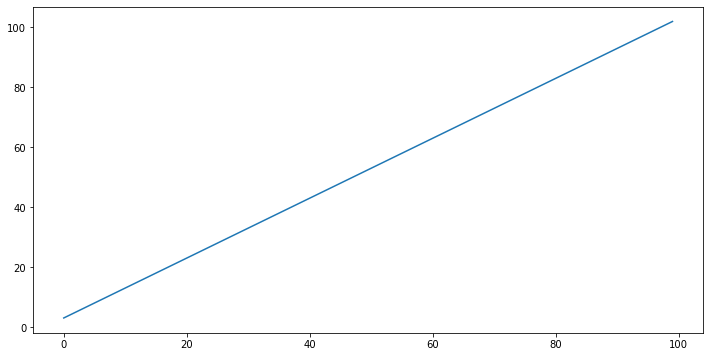

array([  3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,  14,  15,
        16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,  27,  28,
        29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,  40,  41,
        42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,  53,  54,
        55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,  66,  67,
        68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,  79,  80,
        81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,  92,  93,
        94,  95,  96,  97,  98,  99, 100, 101, 102])

In [1]:
import numpy as np
import matplotlib.pyplot as plt

line = np.array([i + 3 for i in range(100)])
figure = plt.figure(figsize = (12,6))
plt.plot(line)
plt.show()
line

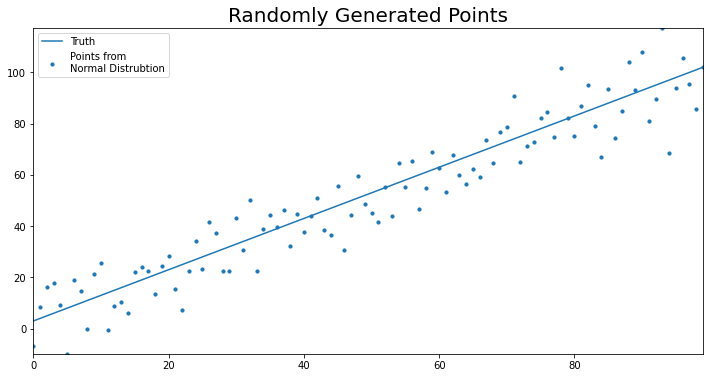

In [2]:
import random

points = []
for point in line:
    points.append(random.normalvariate(point, 10))

figure = plt.figure(figsize = (12, 6))
plt.rcParams["axes.xmargin"] = 0
plt.rcParams["axes.ymargin"] = 0
plt.plot(line, label ="Truth")
plt.scatter(np.arange(len(points)), points, s = 10,
           label = "Points from\nNormal Distrubtion")
plt.title("Randomly Generated Points", fontsize = 20)
plt.legend(loc = "best")
plt.show()

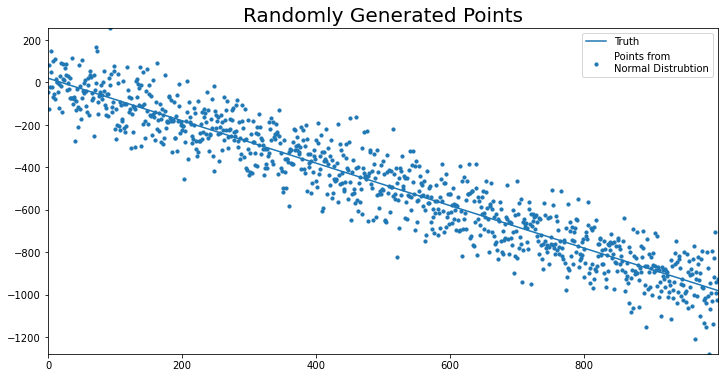

In [3]:
import random

def build_random_data_with_line(y_int, slope, SD = 1, line_length = 100):
    line = np.array([slope * i + y_int for i in range(line_length)])    
    points = []
    for point in line:
        points.append(random.normalvariate(point, SD))
        
    return line, points

def plot_line(line, points, line_name = "Truth",
              title = "Randomly Generated Points"):

    figure = plt.figure(figsize = (12, 6))
    plt.rcParams["axes.xmargin"] = 0
    plt.rcParams["axes.ymargin"] = 0
    plt.plot(line, label =line_name)
    plt.scatter(np.arange(len(points)), points, s = 10,
               label = "Points from\nNormal Distrubtion")
    plt.title("Randomly Generated Points", fontsize = 20)
    plt.legend(loc = "best")
    plt.show()
    
line, points = build_random_data_with_line(y_int = 20, slope = -1, SD = 100, line_length = 1000)
plot_line(line, points)

# Making a Monte Carlo Simulation

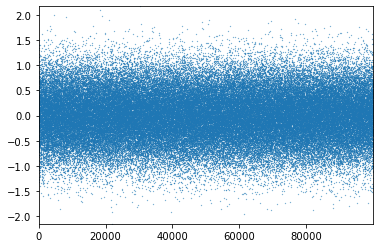

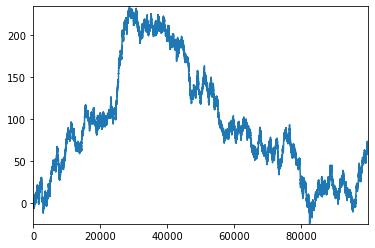

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random


mu = 0
sigma = .5
random_list = []
observations = 100000
for i in range(100000):
    random_list.append(random.normalvariate(mu, sigma))

plt.plot(random_list, ls = "",linewidth = 1, marker =".", markersize = .5)
plt.show()
plt.close()

simulation = [] 

for i in range(len(random_list)):
    val = random_list[i]
    if i == 0:
        simulation.append(val)
    else:
        simulation.append(simulation[i-1] + val)
        
plt.plot(simulation)
plt.show()
plt.close()

In [5]:
def run_monte_carlo(mean, sigma, num_sims, sim_dict, index):
    
    for i in range(num_sims):
        sim_dict[i] = {}
        for ix in index:
            sim_dict[i][ix] = random.normalvariate(mean, sigma)

In [6]:
mean = 0
sigma = 1
monte_carlo_sim_dict = {}
num_sims = 2000
index = np.arange(2000)
run_monte_carlo(mean, sigma, num_sims, monte_carlo_sim_dict, index)
        
monte_carlo_sim_df = (pd.DataFrame(monte_carlo_sim_dict))
        
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,-0.098015,-1.759523,0.018121,-0.763531,0.232427,-0.777537,-2.492784,-0.938236,2.075428,1.179781,...,-1.542852,-0.752459,-0.477882,-0.174505,-0.554888,0.256298,-0.260411,0.517518,0.346432,-2.149318
1,0.301664,0.171871,-0.127687,0.134682,1.369453,0.174008,1.037280,-0.869826,0.297620,1.690048,...,-0.374680,-1.703526,-0.347241,-0.204056,-0.838356,-0.005243,1.156548,-1.463023,1.221643,0.127454
2,-0.511648,0.645603,1.019857,-0.845348,-0.397141,0.353584,-0.394793,0.901957,-0.676345,0.414629,...,-1.812598,-0.338917,0.963924,-0.883544,-0.625958,-0.992631,-0.018022,-0.265191,0.624528,0.006700
3,-0.604971,-0.171309,-1.020769,0.440822,0.164819,1.180141,-0.114980,0.543110,2.263955,-0.427150,...,0.340703,1.005525,-0.311902,0.353617,-0.192113,-1.920963,0.538344,-0.531753,0.024621,-0.443583
4,1.539430,-2.658664,1.551192,-0.140070,-2.182577,0.616266,2.024710,-0.983660,-0.106642,0.639484,...,0.602884,0.581195,0.580681,0.549984,1.371156,-0.153862,0.158178,1.131537,1.726299,-1.590512
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,-0.285666,-0.629830,0.888520,-1.434614,0.783163,-1.015764,0.472980,-0.580781,-0.733807,0.831145,...,0.385440,-0.782738,0.558796,-0.649676,-0.079423,-0.133210,1.509182,-1.131003,0.076569,0.304303
1996,0.656422,0.176723,0.557057,2.087822,1.985212,2.211932,2.808666,-1.599571,-0.729558,0.699394,...,-0.004828,0.901801,-0.210426,-0.666261,-0.652119,-0.169453,-0.210144,-0.779757,-0.958756,1.730139
1997,1.056757,0.096381,0.438561,-0.451455,0.241533,0.345905,0.000327,0.313770,0.153284,1.968228,...,0.318221,0.320310,0.297165,-1.360832,0.452241,-1.422007,1.654025,-1.474195,0.396745,-0.142384
1998,1.868335,-0.547685,0.218514,-2.330636,0.908744,-1.032965,0.021458,1.379242,-1.330092,-0.088048,...,0.826012,-0.614104,-0.293143,-0.037236,0.307773,0.849736,-1.068293,0.399816,-1.469393,-0.670615


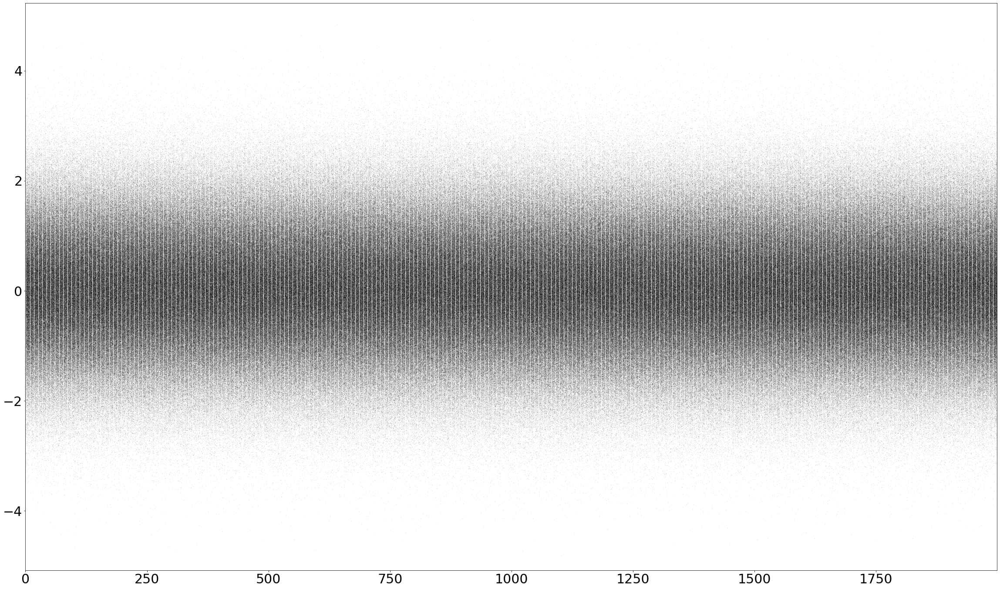

In [7]:
plt.rcParams["axes.xmargin"] = 0
plt.rcParams["axes.ymargin"] = 0
plt.rcParams["font.size"] = 30

fig, ax = plt.subplots(figsize = (40, 24))
monte_carlo_sim_df.plot.line(legend = False, ls = " ", marker=".", markersize = .2, 
                            color ="k", alpha = .5, ax = ax)

plt.show()

<ipython-input-8-d93dfd6ebd52>:7: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([str(int(y * 100)) + "%" for y in y_vals])


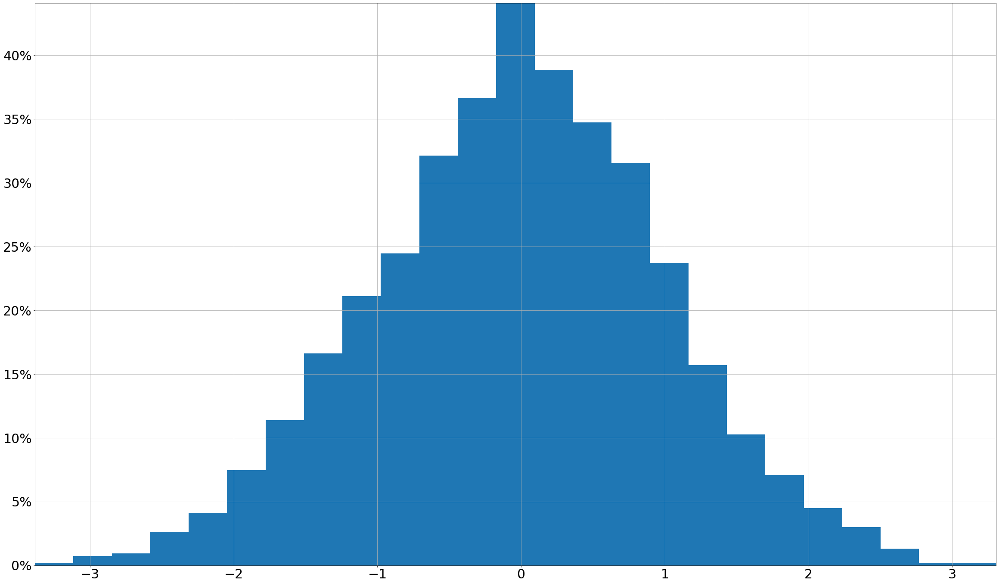

In [8]:
fig, ax = plt.subplots(figsize = (40, 24))
monte_carlo_sim_df.iloc[-1].hist(bins = 25, density = True,
                                ax = ax)

y_vals = ax.get_yticks()
ax.set_yticklabels([str(int(y * 100)) + "%" for y in y_vals])
plt.show()
plt.close()

## Monte Carlo with a Positive Trend

In [9]:
mean = .05
sigma = .5
monte_carlo_sim_dict = {}
num_sims = 2000
periods = 2000
index = np.arange(periods)
run_monte_carlo(mean, sigma, num_sims, monte_carlo_sim_dict, index)

pd.DataFrame(monte_carlo_sim_dict)

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,-0.189601,-1.415369,-0.678024,0.155388,1.104182,0.395139,-0.999921,-0.076232,1.466291,-0.027077,...,-0.540786,-0.212075,0.055050,0.601280,0.189792,-0.065530,-0.284517,-0.389287,-0.815296,0.969133
1,0.073771,-2.449303,-1.485343,-0.280996,0.598462,0.046161,-0.711375,0.866273,1.435886,-0.426115,...,0.206519,-0.881849,0.092965,0.791240,0.070164,0.509902,-0.525782,-1.013106,-1.347196,1.287946
2,0.906028,-3.089401,-2.594840,0.671938,-0.012374,-1.007623,-0.269296,0.671411,0.354883,-0.060660,...,0.075377,-0.431934,-0.125757,0.468588,-0.135743,0.574875,-1.033277,-0.712533,-1.648912,0.705168
3,0.858965,-3.369620,-3.234277,-0.459317,-0.259582,-0.760793,-0.875075,0.523478,0.292093,-0.113780,...,0.268135,-0.848246,-0.965516,0.454805,-0.292289,0.436829,-1.162931,-0.936193,-2.362129,1.471864
4,0.739430,-2.794830,-2.881700,-1.544179,-0.397359,-0.645375,-0.473058,0.679991,0.481949,0.430846,...,-0.146366,-0.537043,-0.606519,0.173827,0.036748,0.535742,-0.660708,-0.086367,-3.132413,1.176680
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,74.125124,101.825603,85.140049,79.683555,100.233829,125.282527,73.436787,116.377585,118.564541,85.750201,...,91.991112,84.114557,101.783861,132.896531,76.173953,139.098339,129.400838,101.252732,64.885423,111.115659
1996,74.335147,102.480873,85.077346,80.900888,99.646262,125.410827,73.610544,116.876134,117.916360,85.452652,...,91.252674,84.365950,102.101739,132.248171,76.867229,138.617285,129.395531,100.471837,65.166228,110.767380
1997,74.021488,103.045063,84.482331,81.825862,99.381754,124.799330,73.972261,116.951078,118.233465,85.078794,...,90.471223,85.509420,101.505922,131.454369,77.217027,138.888973,129.837186,99.831942,65.707455,110.443213
1998,73.926416,103.626985,85.005327,81.538122,99.162256,123.793388,73.934983,117.001105,117.804167,85.630920,...,90.683268,86.035310,102.026805,131.013612,76.771093,138.825200,130.045149,99.641000,65.655780,110.487920


In [ ]:
monte_carlo_sim_df = pd.DataFrame(monte_carlo_sim_dict).cumsum()
monte_carlo_sim_df

In [10]:
def plot_monte_carlo_sim(sim_data,  
                         title = None, 
                         logy = True):
    sim_data["mean"] = sim_data.mean(axis=1)
    fig, 
    ax = plt.subplots(figsize = (40, 24))
    sim_data.drop("mean", inplace = False, axis = 1).plot.line(
            legend=False, 
            marker =".", 
            markersize = .1, 
            color = "k", 
            alpha = .05, 
            logy = logy, 
            ax = ax)
    sim_data["mean"].plot.line(legend = False, 
                                color = "C3", 
                               linewidth = 5, 
                               logy = logy, 
                               ax = ax)
    
    
    plt.title(title, fontsize = 50)
    plt.show()
    plt.close()

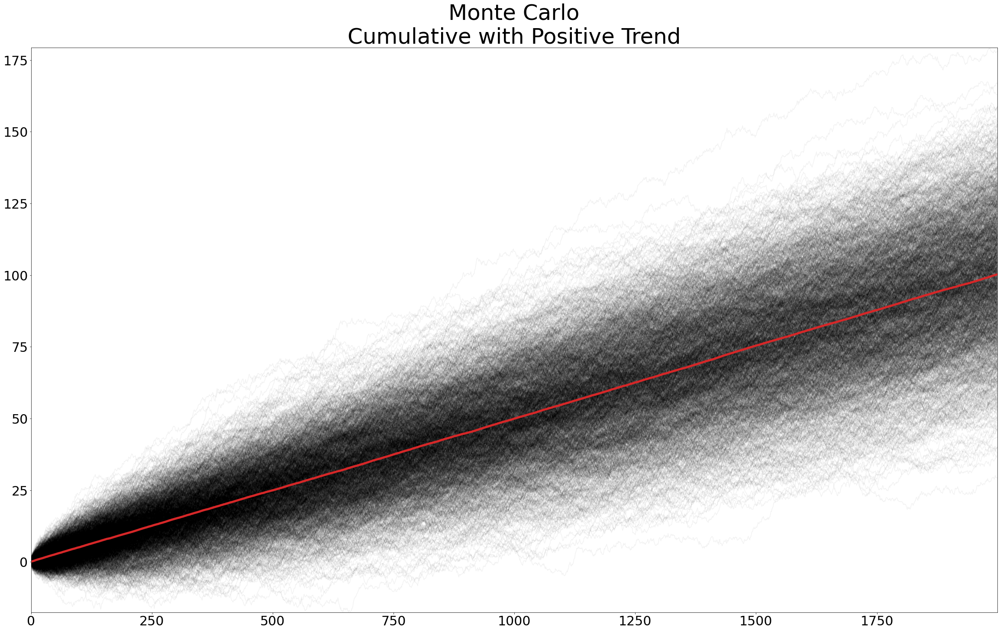

In [11]:
plot_monte_carlo_sim(monte_carlo_sim_df,  
                    title = "Monte Carlo\nCumulative with Positive Trend", 
                     logy = False)

## Calculating Expected Value

In [12]:
monte_carlo_sim_df["mean"] = monte_carlo_sim_df.mean(axis = 1)
monte_carlo_sim_df["mean"]

0         0.050825
1         0.115895
2         0.161175
3         0.212922
4         0.267657
           ...    
1995    100.045237
1996    100.098893
1997    100.150937
1998    100.187944
1999    100.231184
Name: mean, Length: 2000, dtype: float64

## Simulating Changes in Portfolio Values

In [13]:
import pandas_datareader.data as web
import datetime

start = datetime.datetime(2005, 1, 1)
end = datetime.datetime.today()

data_dict = {}
stocks = "MSFT", "AAPL", "IBM", "GOOG"
for name in stocks:
    data_dict[name] = web.DataReader(name, "yahoo", start, end)


In [ ]:
close_data_dict = {key:val["Close"] for key, 
                   val in data_dict.items()}
close_data_df = pd.DataFrame(close_data_dict)
close_data_df

In [14]:
close_data_pct_change = close_data_df.pct_change()
close_data_pct_change

,MSFT,AAPL,IBM,GOOG
Date,,,,
2005-01-03,NaN,NaN,NaN,NaN
2005-01-04,0.003740,0.010270,-0.010742,-0.040501
2005-01-05,-0.002235,0.008758,-0.002068,-0.005090
2005-01-06,-0.001120,0.000775,-0.003109,-0.025632
2005-01-07,-0.002991,0.072811,-0.004366,0.028109
...,...,...,...,...
2021-11-29,0.021081,0.021874,0.023228,0.023164
2021-11-30,-0.017943,0.031578,-0.011814,-0.025063
2021-12-01,-0.001543,-0.003206,-0.001537,-0.005855


In [15]:
close_data_normalized = close_data_pct_change.add(1).cumprod()
close_data_normalized.fillna(1, inplace =True)
close_data_normalized

,MSFT,AAPL,IBM,GOOG
Date,,,,
2005-01-03,1.000000,1.000000,1.000000,1.000000
2005-01-04,1.003740,1.010270,0.989258,0.959499
2005-01-05,1.001496,1.019118,0.987212,0.954615
2005-01-06,1.000374,1.019908,0.984143,0.930146
2005-01-07,0.997382,1.094169,0.979847,0.956292
...,...,...,...,...
2021-11-29,12.589006,141.782849,1.268041,28.940194
2021-11-30,12.363126,146.260014,1.253060,28.214877
2021-12-01,12.344053,145.791063,1.251134,28.049691


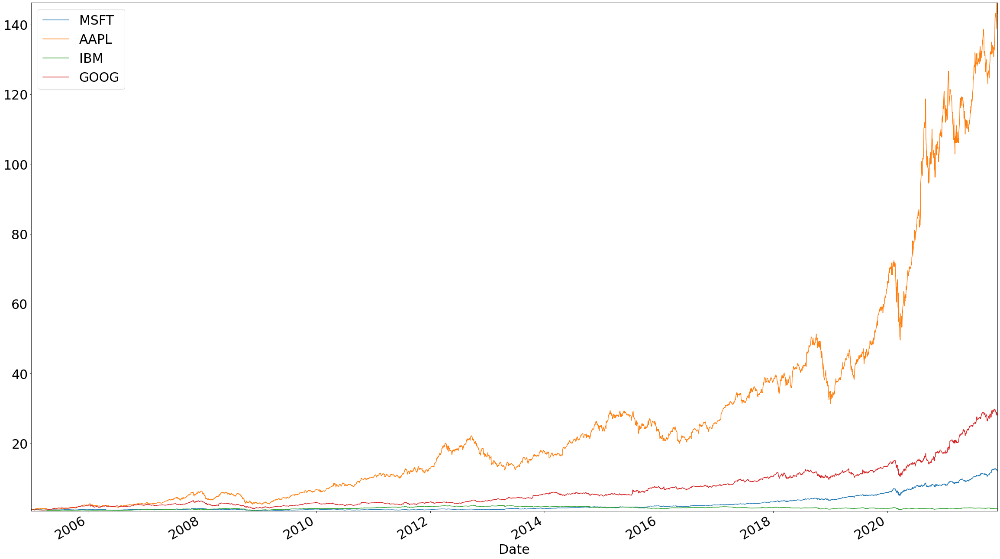

In [16]:
fig, ax = plt.subplots(figsize=(40,24))
close_data_normalized.plot.line(ax = ax)
plt.show()
plt.close()

## Daily Rate of Return

We get the daily rate of return from the present value equation.

$PV = \frac{FV}{(1 + r)^t}$

Overall rate of return: $R=\frac{FV}{PV}$

We discount the overall rate of return to find the average rate of return. We will use this to define the mean of the standard normal distribution:

$ r = (R)^{\frac{1}{t}} - 1$

$t$ is measured in trading days

In [17]:
mean_var_df = pd.DataFrame(
    {"mean": close_data_normalized.iloc[-1].div(close_data_normalized.iloc[0]) ** (
        1 / close_data_normalized["MSFT"].count()) - 1, 
                            "sigma" : close_data_pct_change.std()})
mean_var_df

,mean,sigma
MSFT,0.000585,0.017056
AAPL,0.001166,0.020767
IBM,0.000056,0.014585
GOOG,0.000784,0.018616


In [18]:
num_sims = 500
dates = list(close_data_df.index)
monte_carlo_sim_dict = {}
for stock in stocks:
    monte_carlo_sim_dict[stock] = {}
    mean = mean_var_df["mean"][stock]
    sigma = mean_var_df["sigma"][stock]   
    run_monte_carlo(mean, 
                    sigma, 
                    num_sims, 
                    monte_carlo_sim_dict[stock], 
                    dates)
#    monte_carlo_sim_dict[stock] = pd.DataFrame(monte_carlo_sim_dict[stock]).add(1).cumprod()
monte_carlo_sim_dfs = {stock: pd.DataFrame(monte_carlo_sim_dict[stock]).add(1).cumprod() for stock in stocks}

In [19]:
monte_carlo_sim_dfs

{'MSFT':                   0          1         2          3         4         5    \
 2005-01-03   1.005915   0.982201  0.996942   1.006325  0.991100  0.993661   
 2005-01-04   0.997975   0.970162  0.982633   1.002155  1.012342  0.998947   
 2005-01-05   1.003037   0.942054  0.986700   0.976789  0.982335  1.029552   
 2005-01-06   0.993117   0.922251  0.988018   0.980721  0.987412  1.007852   
 2005-01-07   0.959780   0.902990  0.994520   0.971748  0.972630  0.995703   
 ...               ...        ...       ...        ...       ...       ...   
 2021-11-29  12.006467  40.454443  3.158383  10.081851  3.467388  1.088824   
 2021-11-30  11.773529  39.849675  3.222541  10.163149  3.437357  1.071928   
 2021-12-01  11.956219  40.548093  3.315987  10.098786  3.414623  1.065700   
 2021-12-02  12.196901  40.330499  3.267657  10.049548  3.381699  1.097838   
 2021-12-03  12.276290  39.273798  3.155723   9.627424  3.420746  1.105698   
 
                  6          7         8         9    

In [20]:
def plot_monte_carlo_sim(sim_data, 
                         observed_data = None, 
                         title = None, 
                         logy = True):
    sim_data["mean"] = sim_data.mean(axis=1)    
    index = sim_data.index
    fig, ax = plt.subplots(figsize = (40, 24))
    sim_data.drop(["mean"], inplace = False, axis = 1).plot.line(
            legend=False, marker =".",
        markersize = .1, 
        color = "k", 
        alpha = .05, 
        logy = logy, 
        ax = ax)
    if observed_data is not None:
        observed_data.plot.line(legend = False, 
                                color = "C1", 
                                linewidth = 5, 
                                logy = logy, 
                                ax = ax)
    
        obs_text_x = observed_data[observed_data == observed_data.min()].index
        plt.text(obs_text_x, observed_data.loc[obs_text_x] * .7,
                 "Observed", fontsize = 70, color = "C3")
        
    sim_data["mean"].plot.line(legend = False, color = "C3", 
                               linewidth = 5, logy = logy, ax = ax)
    plt.text(index[-400], sim_data["mean"].iloc[-400] * 1.5, "Exp\nVal",
            fontsize = 70, color = "C3")
   
    
    
    plt.title(title, fontsize = 50)
    plt.show()
    plt.close()

In [21]:
monte_carlo_sim_dfs[stock].median(axis = 1)

2005-01-03     1.001554
2005-01-04     1.003310
2005-01-05     1.006223
2005-01-06     1.003226
2005-01-07     1.005204
                ...    
2021-11-29    12.486562
2021-11-30    12.437700
2021-12-01    12.528604
2021-12-02    12.751865
2021-12-03    12.907147
Length: 4261, dtype: float64

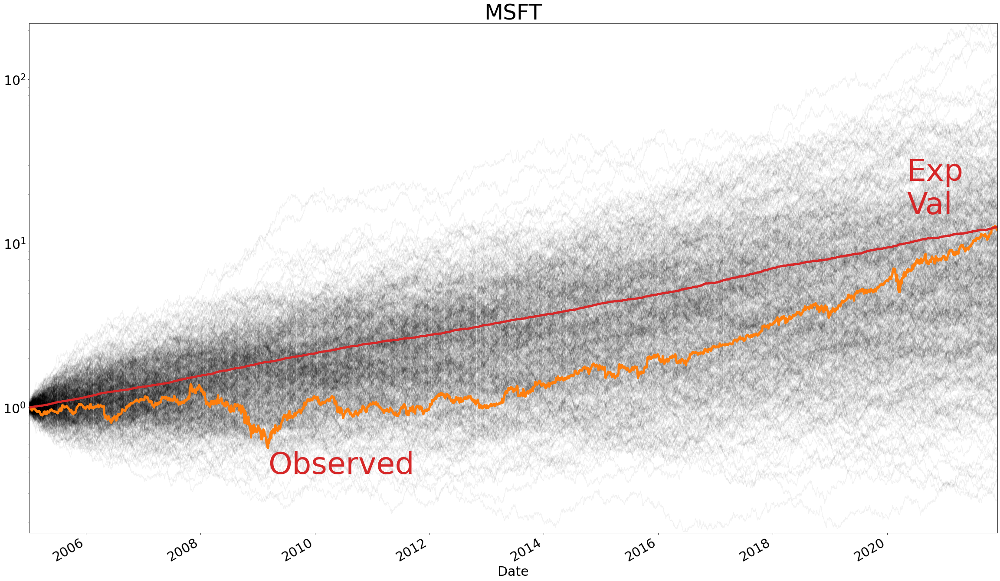

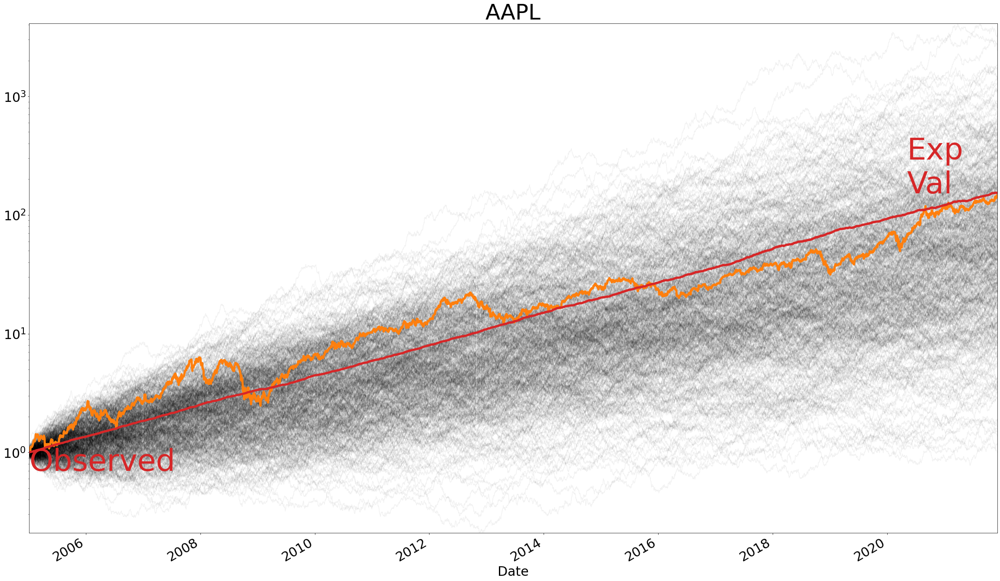

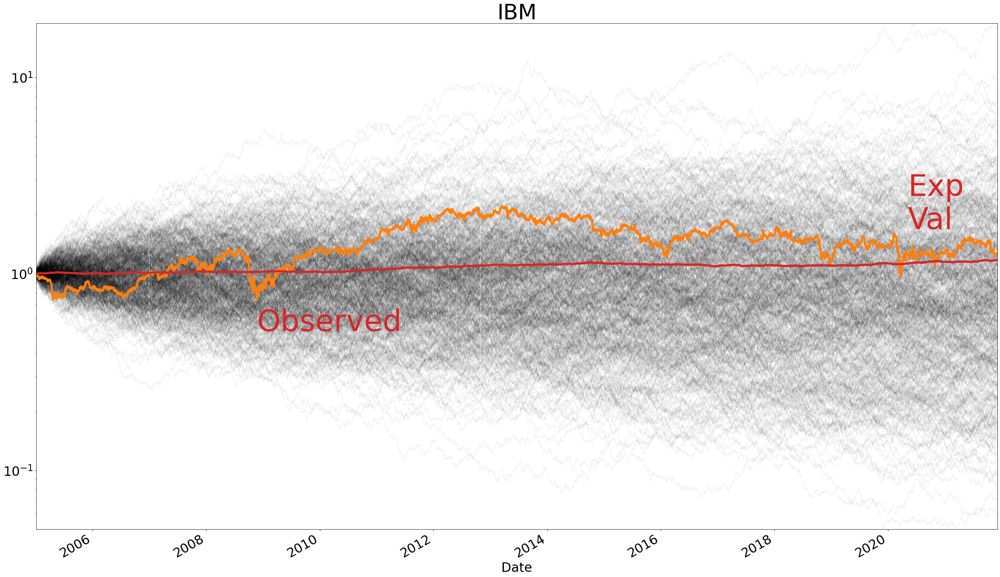

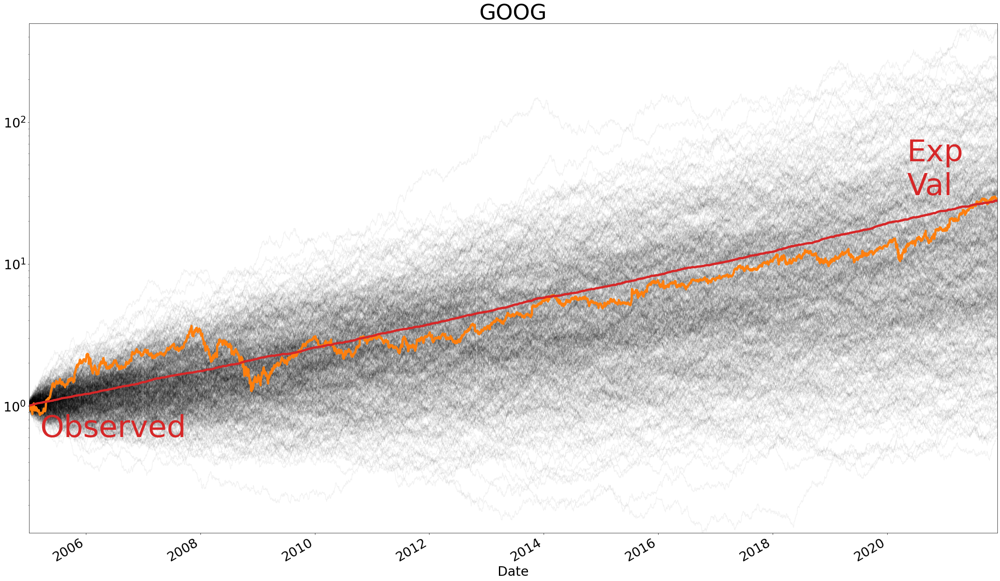

In [22]:
for stock in stocks:
    plot_monte_carlo_sim(monte_carlo_sim_dfs[stock], 
                         close_data_normalized[stock], 
                         stock, 
                         logy= True)

## Calculate Portfolio Return

In [23]:
portfolio_weights = {stock: 1 / len(stocks) for stock in stocks}
portfolio_weights

{'MSFT': 0.25, 'AAPL': 0.25, 'IBM': 0.25, 'GOOG': 0.25}

In [24]:
ex_return = pd.DataFrame(close_data_normalized.apply
                         (lambda x :x.mul(portfolio_weights[x.name]), 
                          axis = 0).sum(axis=1),
                        columns = ["Portfolio Return"])

In [25]:
close_data_normalized["Portfolio Return"] = ex_return
close_data_normalized

,MSFT,AAPL,IBM,GOOG,Portfolio Return
Date,,,,,
2005-01-03,1.000000,1.000000,1.000000,1.000000,1.000000
2005-01-04,1.003740,1.010270,0.989258,0.959499,0.990692
2005-01-05,1.001496,1.019118,0.987212,0.954615,0.990610
2005-01-06,1.000374,1.019908,0.984143,0.930146,0.983643
2005-01-07,0.997382,1.094169,0.979847,0.956292,1.006923
...,...,...,...,...,...
2021-11-29,12.589006,141.782849,1.268041,28.940194,46.145023
2021-11-30,12.363126,146.260014,1.253060,28.214877,47.022769
2021-12-01,12.344053,145.791063,1.251134,28.049691,46.858985


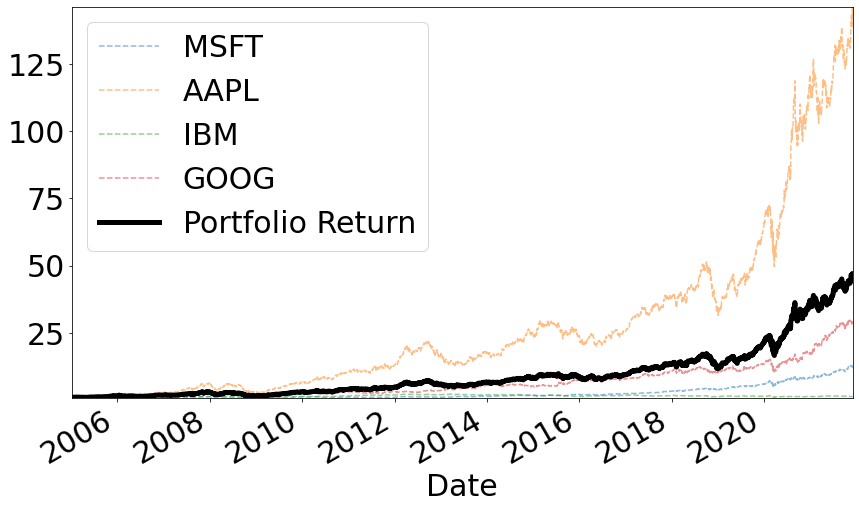

In [26]:
fig, ax = plt.subplots(figsize = (14,8))
close_data_normalized.drop(["Portfolio Return"],
                           axis = 1).plot.line(linestyle = "--",
                                               alpha = .5,
                                               ax = ax)
close_data_normalized[["Portfolio Return"]].plot.line(linewidth = 5,
                                                      color = "k",
                                                      ax = ax)

plt.legend()

In [27]:
ex_return_pct_change = ex_return.pct_change()
ex_return_pct_change.dropna(inplace = True)
ex_return_pct_change

,Portfolio Return
Date,
2005-01-04,-0.009308
2005-01-05,-0.000082
2005-01-06,-0.007033
2005-01-07,0.023667
2005-01-10,0.001298
...,...
2021-11-29,0.022031
2021-11-30,0.019021
2021-12-01,-0.003483


In [28]:
t = ex_return["Portfolio Return"].count()
PV = ex_return.iloc[0]
FV = ex_return.iloc[-1]

mean_var_df = pd.DataFrame({"mean": (
    FV / PV) ** (1 / t) -1,
                           "sigma" : ex_return_pct_change.std()})
mean_var_df

,mean,sigma
Portfolio Return,0.0009,0.016469


In [29]:
num_sims = 1000
dates = ex_return.index
monte_carlo_sim_dict = {}
mean = mean_var_df["mean"]["Portfolio Return"]
sigma = mean_var_df["sigma"]["Portfolio Return"]
run_monte_carlo(mean,
                sigma,
                num_sims,
                monte_carlo_sim_dict,
                
                dates)
monte_carlo_sim_df = pd.DataFrame(monte_carlo_sim_dict).add(1).cumprod()
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
2005-01-03,0.987794,0.974197,0.963045,0.997895,0.987889,1.020484,1.011486,0.988881,1.021937,1.000994,...,1.009709,1.013526,1.004735,0.997088,0.994682,0.971257,0.985464,1.025515,1.015766,0.992541
2005-01-04,1.013403,0.986021,0.958102,1.003346,0.994871,1.039346,0.977560,0.997145,1.039813,1.003764,...,0.993384,0.988929,1.026777,0.991541,0.988010,0.963680,0.986593,1.042954,1.008734,0.950101
2005-01-05,1.047696,0.974947,0.952270,1.032947,1.018173,1.058328,0.992442,0.991649,1.062505,0.969588,...,1.004454,0.974149,1.032431,0.998626,0.968678,0.964867,0.986311,1.042523,1.007507,0.959749
2005-01-06,1.093223,0.987460,0.969705,1.046383,1.030191,1.102187,0.997674,1.019449,1.047727,0.952501,...,1.015563,0.978991,1.022741,1.013679,0.944800,0.945432,0.978245,1.037066,1.004150,0.960333
2005-01-07,1.073911,1.002136,0.972019,1.042087,1.044536,1.093810,1.001637,1.019226,1.056614,0.956320,...,1.035833,0.982127,1.023448,1.023801,0.919155,0.951623,0.973594,1.026644,0.999435,0.971016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-29,17.946146,5.165322,9.311812,11.415147,26.100506,64.521196,149.855088,96.219005,27.437165,5.815337,...,11.662869,35.047937,16.590697,27.995253,25.383952,44.811025,78.885535,53.701159,7.318673,15.519677
2021-11-30,18.474279,5.133068,9.362773,11.492895,26.007022,65.416957,152.000330,93.555195,27.099542,5.745797,...,11.836934,35.452298,16.763154,28.373961,25.267273,44.575109,77.641179,52.697374,7.182961,15.719305
2021-12-01,18.534178,5.252882,9.410786,11.594247,25.973317,65.013774,153.485199,94.685549,26.793014,5.831815,...,11.710701,35.415363,16.702535,28.664927,25.916480,44.841508,79.700345,53.889864,7.292199,15.731736
2021-12-02,18.562230,5.296048,9.632303,11.540019,25.620662,64.363920,153.970913,94.117862,27.225391,5.862341,...,11.857096,34.637907,16.502455,28.964764,25.994752,45.212232,80.477053,53.810991,7.199782,15.565349


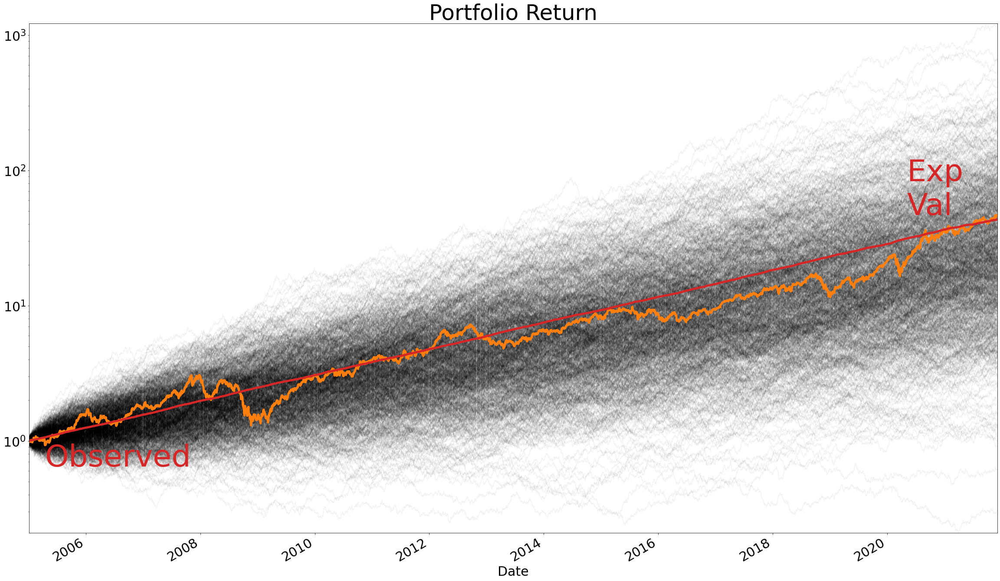

In [30]:
plot_monte_carlo_sim(sim_data = monte_carlo_sim_df,
                    observed_data = ex_return["Portfolio Return"],
                    title = "Portfolio Return",
                    logy = True
                    )

End of Project 12 Notes